### Summarizing data with PCA

This activity is meant to explore the results of applying PCA to a dataset.  Below, a dataset from a credit card company is loaded and displayed.  This dataset contains customer data pertaining to demographic and payment information as well as basic demographics.  The final column `default payment next month` is what we want to create profiles for.  

You are to use PCA and reduce the dimensionality of the data to 2 and 3 dimensions.  Then, draw scatterplots of the resulting data and color them by `default`.  Does it seem that 2 or 3 principal components will seperate the data into clear groups?  Why or why not?  You should post your visualizations and argument for whether the components offer more succinct data representations on the discussion board for this activity.  (Note: In this assignment you should use the sklearn version of `PCA`.)

In [6]:
import pandas as pd
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [8]:
default = pd.read_csv('data/credit.csv', index_col=0)

In [9]:
default.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_1                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int64
 14  BILL_A

In [9]:
default.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
ID,,,,,,,,,,,,,,,,,,,,,
1,20000.0,2,2,1,24,2,2,-1,-1,-2,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
2,120000.0,2,2,2,26,-1,2,0,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
3,90000.0,2,2,2,34,0,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
4,50000.0,2,2,1,37,0,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
5,50000.0,1,2,1,57,-1,0,-1,0,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


##### Plotting in 3D

Below, example plots are made with both `matplotlib` and with `plotly` to demonstrate how to construct three dimensional plots.  

`matplotlib`

In `matplotlib` an `axes` object is created where the projection is specified as '3d'.  Then, the `axes` are use to plot a 3D object on.  Below, a scatter plot is built, but there are many 3D objects that can be created in addition to points.  For more information see the documentation on 3D plotting [here](https://matplotlib.org/stable/api/toolkits/mplot3d.html?highlight=3d).


`plotly`

Use the `scatter_3d` function directly.

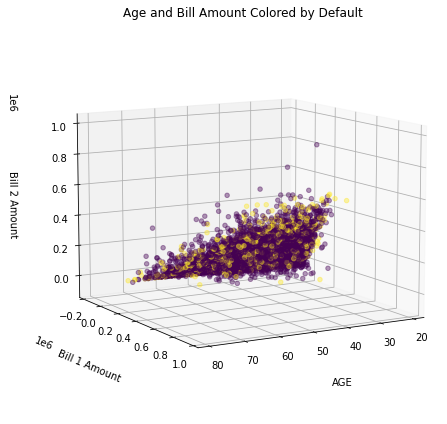

In [11]:
plt.figure(figsize = (6,6))
ax = plt.axes(projection = '3d')
ax.scatter3D(default['AGE'], default['BILL_AMT1'], default['BILL_AMT2'], c = default['default.payment.next.month'], alpha = 0.4)
ax.set_xlabel('AGE', labelpad = 20)
ax.set_ylabel('Bill 1 Amount', labelpad = 20)
ax.set_zlabel('Bill 2 Amount', labelpad = 20)
ax.view_init(10, 60)
plt.title('Age and Bill Amount Colored by Default')
plt.tight_layout();

In [13]:
px.scatter_3d(data_frame=default, x = 'AGE', y = 'BILL_AMT1', z = 'BILL_AMT2', color = 'default.payment.next.month')

In [14]:
#from sklearn.decomposition import PCA

In [129]:
# for 90% variance
pca_s = PCA(.90)
print(pca_s.fit_transform(default).shape)


(30000, 2)


# principal component = 2

In [130]:
pca = PCA(2)
pca.fit(default)

PCA(n_components=2)

In [131]:
pca.explained_variance_ratio_ # note the two components cover more than 90% of variance

array([0.61043701, 0.29535381])

In [132]:
np_pca = pca.fit_transform(default)
df_pca = pd.DataFrame(np_pca,columns = ['component_1','component_2'])
df_pca.shape

(30000, 2)

In [133]:
#append the target column
df_pca['default.payment.next.month'] = default['default.payment.next.month']
df_pca
finalDf

,component_1,component_2,default.payment.next.month
0,-166488.191086,-75538.153664,NaN
1,-114226.976817,9780.671250,1.0
2,-98432.362180,-33471.387330,1.0
3,-71230.675903,-95224.273104,0.0
4,-114834.618365,-68729.185233,0.0
...,...,...,...
29996,-97718.568024,35089.032854,0.0
29997,-140206.128048,-77857.496540,0.0
29998,-41427.740774,-74908.303672,1.0
29999,-70860.311209,-95514.144310,1.0


In [96]:
# scatter plot
px.scatter(data_frame=df_pca, x = 'component_1', y = 'component_2'  , color = 'default.payment.next.month')

# principal component = 3

In [107]:
pca3 = PCA(n_components = 3)
pca3.fit(default)

PCA(n_components=3)

In [33]:
pca3.explained_variance_ratio_ # note with three principal components the change in variance is not very significant

array([0.61043701, 0.29535381, 0.03052419])

In [109]:
np_pca = pca3.fit_transform(default)
#df_pca3 = pd.DataFrame(np_pca)
df_pca3 = pd.DataFrame(np_pca,columns = ['component_1','component_2','component_3'])
df_pca3.shape

(30000, 3)

In [110]:
#append the target column
df_pca3['default.payment.next.month'] = default['default.payment.next.month']
df_pca3

,component_1,component_2,component_3,default.payment.next.month
0,-166488.191086,-75538.153664,-472.952105,NaN
1,-114226.976817,9780.671250,2734.447477,1.0
2,-98432.362180,-33471.387330,-2678.469791,1.0
3,-71230.675903,-95224.273104,-10047.716972,0.0
4,-114834.618365,-68729.185233,24604.948085,0.0
...,...,...,...,...
29995,200018.431425,-55465.636023,-141623.472655,1.0
29996,-97718.568024,35089.032854,4753.925193,0.0
29997,-140206.128048,-77857.496540,26243.133382,0.0
29998,-41427.740774,-74908.303672,17722.587980,1.0


In [113]:
px.scatter_3d(data_frame=df_pca3, x = 'component_1', y = 'component_2', z = 'component_3', color = 'default.payment.next.month')

<Figure size 576x576 with 0 Axes>

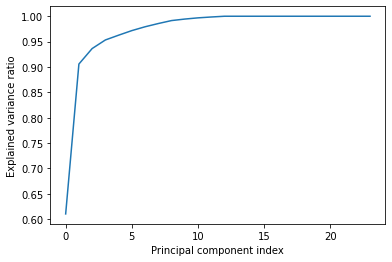

In [145]:
pca = PCA()
X_pca = pca.fit_transform(default)
exp_var_pca = pca.explained_variance_ratio_
cum_sum = np.cumsum(exp_var_pca)
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.plot(cum_sum)
